In [1]:
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

In [2]:
from fastbook import *
from fastai.vision.widgets import *

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', 'e64e662e531842f7a26bde61cc318799')

In [4]:
results = search_images_bing(key, 'succulent')
ims = results.attrgot('content_url')
len(ims)

150

In [5]:
plant_types = 'succulent','cactus','tree'
path = Path('plant')

In [6]:
if not path.exists():
    path.mkdir()
    for o in plant_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o}')
        download_images(dest, urls=results.attrgot('contentUrl'))

In [7]:
fns = get_image_files(path)
fns

(#430) [Path('plant/tree/00000092.jpg'),Path('plant/tree/00000108.jpg'),Path('plant/tree/00000144.jpg'),Path('plant/tree/00000010.jpg'),Path('plant/tree/00000009.jpg'),Path('plant/tree/00000147.jpg'),Path('plant/tree/00000074.jpg'),Path('plant/tree/00000022.jpg'),Path('plant/tree/00000054.jpg'),Path('plant/tree/00000110.jpg')...]

In [8]:
failed = verify_images(fns)
failed

(#0) []

In [9]:
failed.map(Path.unlink);

In [10]:
plants = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

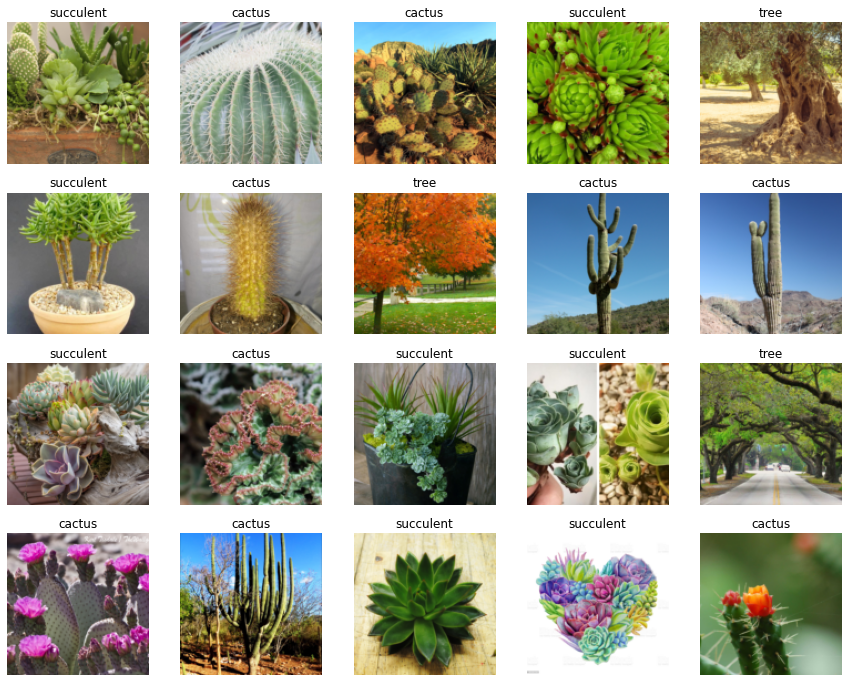

In [11]:
dls = plants.dataloaders(path)
dls.valid.show_batch(max_n=20, nrows=4)

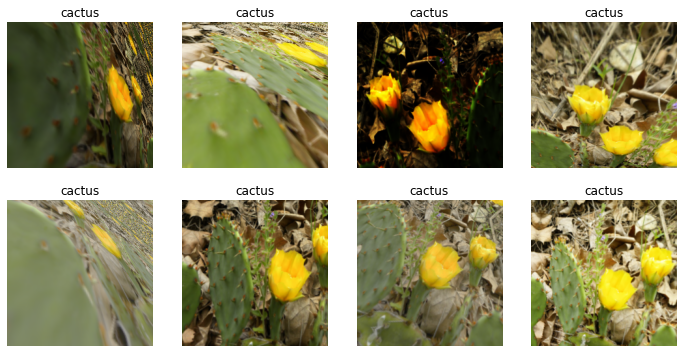

In [12]:
plants = plants.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms(mult=3))
dls = plants.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [13]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(10)

epoch,train_loss,valid_loss,error_rate,time
0,1.611510,0.887703,0.313953,00:17


epoch,train_loss,valid_loss,error_rate,time
0,1.035686,0.574444,0.220930,00:17
1,0.909860,0.418602,0.162791,00:17
2,0.807786,0.371909,0.116279,00:18
3,0.739977,0.431610,0.104651,00:17
4,0.663137,0.480846,0.104651,00:17
5,0.597509,0.485457,0.104651,00:17
6,0.562903,0.475631,0.093023,00:18
7,0.549948,0.453228,0.093023,00:18
8,0.525828,0.445572,0.104651,00:17
9,0.498348,0.446894,0.093023,00:17


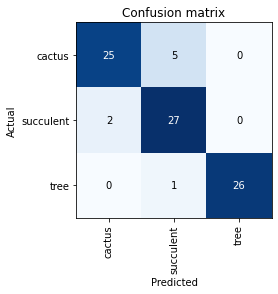

In [14]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

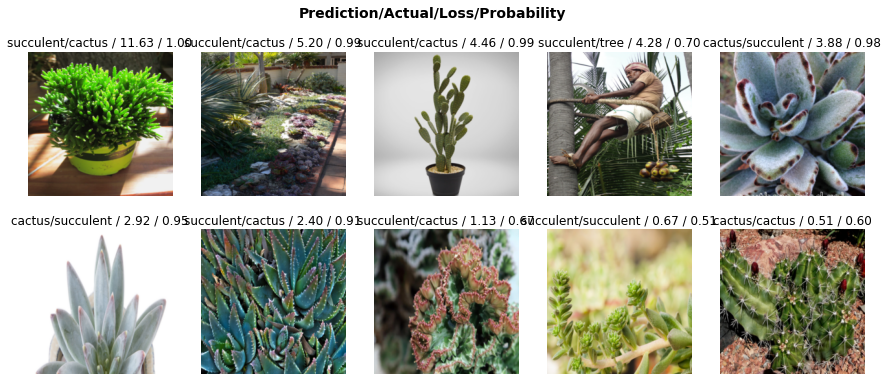

In [15]:
interp.plot_top_losses(10, nrows=2)

In [16]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [21]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [22]:
learn.export()

In [23]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]